# Setup

In [ ]:
# Mount Drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
%cd /content/drive/Shareddrives/Data\ 255/yolov5-env


Mounted at /content/drive
[Errno 2] No such file or directory: '/content/drive/Shareddrives/Data 255/yolov5-env'
/content


### check resource 

In [ ]:
# Check number of GPU
!nvidia-smi -L

GPU 0: Tesla K80 (UUID: GPU-22426ef6-4d81-7876-4f92-9daab1e02b3e)


In [ ]:
# Check GPU activity
!nvidia-smi

Thu Dec  2 02:44:58 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   31C    P8    28W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# Check CPU
!lscpu

Architecture:        x86_64
CPU op-mode(s):      32-bit, 64-bit
Byte Order:          Little Endian
CPU(s):              2
On-line CPU(s) list: 0,1
Thread(s) per core:  2
Core(s) per socket:  1
Socket(s):           1
NUMA node(s):        1
Vendor ID:           GenuineIntel
CPU family:          6
Model:               63
Model name:          Intel(R) Xeon(R) CPU @ 2.30GHz
Stepping:            0
CPU MHz:             2299.998
BogoMIPS:            4599.99
Hypervisor vendor:   KVM
Virtualization type: full
L1d cache:           32K
L1i cache:           32K
L2 cache:            256K
L3 cache:            46080K
NUMA node0 CPU(s):   0,1
Flags:               fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm invpcid_single ssbd ibrs 

In [ ]:
# Check Memory
!free -h --si

              total        used        free      shared  buff/cache   available
Mem:            13G        610M         10G        1.2M        2.2G         12G
Swap:            0B          0B          0B


In [ ]:
import os
os.getcwd()

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Thu Dec  2 02:45:03 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   31C    P8    28W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Setup - Every Run

In [ ]:
# =====
# For first time, clone yolov5 first before continue
# =====
%pip install -qr requirements.txt
%cd yolov5
import utils
display = utils.notebook_init()  # Setup notebook

ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'
[Errno 2] No such file or directory: 'yolov5'
/content


AttributeError: ignored

In [ ]:
# Other imports
import cv2
# from PIL import Image
from IPython.display import Image
import os
from shutil import copyfile
from pathlib import Path
from tqdm import tqdm

copy_dir_2
copy_dir_2 = "/content/drive/Shareddrives/Data 255/DataSets/UFPR-ALPR dataset copy2-samples"

## Setup - One time only

In [ ]:
# Setup (one-time only for google drive)
!git clone https://github.com/ultralytics/yolov5  # clone repository
%cd yolov5
%pip install -qr requirements.txt  # Install requirements
%pip install -q roboflow

Cloning into 'yolov5'...
remote: Enumerating objects: 10069, done.
remote: Total 10069 (delta 0), reused 0 (delta 0), pack-reused 10069
Receiving objects: 100% (10069/10069), 10.36 MiB | 24.11 MiB/s, done.
Resolving deltas: 100% (6986/6986), done.
/content/yolov5
     |████████████████████████████████| 596 kB 5.3 MB/s 
     |████████████████████████████████| 145 kB 6.4 MB/s 
     |████████████████████████████████| 178 kB 32.5 MB/s 
     |████████████████████████████████| 1.1 MB 28.4 MB/s 
     |████████████████████████████████| 67 kB 6.0 MB/s 
     |████████████████████████████████| 138 kB 51.1 MB/s 
     |████████████████████████████████| 62 kB 796 kB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 

# Detect w/ pre-trained model

In [ ]:
# Use detect.py to 1) Download out-of-the-box models; 2) Detect multiple images
!python detect.py -h

usage: detect.py [-h] [--weights WEIGHTS [WEIGHTS ...]] [--source SOURCE]
                 [--imgsz IMGSZ [IMGSZ ...]] [--conf-thres CONF_THRES]
                 [--iou-thres IOU_THRES] [--max-det MAX_DET] [--device DEVICE]
                 [--view-img] [--save-txt] [--save-conf] [--save-crop]
                 [--nosave] [--classes CLASSES [CLASSES ...]] [--agnostic-nms]
                 [--augment] [--visualize] [--update] [--project PROJECT]
                 [--name NAME] [--exist-ok] [--line-thickness LINE_THICKNESS]
                 [--hide-labels] [--hide-conf] [--half] [--dnn]

optional arguments:
  -h, --help            show this help message and exit
  --weights WEIGHTS [WEIGHTS ...]
                        model path(s)
  --source SOURCE       file/dir/URL/glob, 0 for webcam
  --imgsz IMGSZ [IMGSZ ...], --img IMGSZ [IMGSZ ...], --img-size IMGSZ [IMGSZ ...]
                        inference size h,w
  --conf-thres CONF_THRES
                        confidence threshold
  --iou-

In [ ]:
# Examine Source Image (before YOLO) 
data_dir = "/content/yolov5/data/images"
for file in os.listdir(data_dir):
  img_path = os.path.join(data_dir, file)
  print(img_path)
  display.display(PIL.Image(img_path, width=60))

/content/yolov5/data/images/bus.jpg


AttributeError: ignored

In [ ]:
# Run against all images in data/images directory
# Result output to runs/detect directory
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images

detect: weights=['yolov5s.pt'], source=data/images, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-111-g94d8fec torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

100% 14.0M/14.0M [00:00<00:00, 98.2MB/s]

Fusing layers... 
Model Summary: 213 layers, 7225885 parameters, 0 gradients
image 1/2 /content/yolov5/data/images/bus.jpg: 640x480 4 persons, 1 bus, Done. (0.033s)
image 2/2 /content/yolov5/data/images/zidane.jpg: 384x640 2 persons, 1 tie, Done. (0.032s)
Speed: 0.5ms pre-process, 32.4ms inference, 10.1ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


In [ ]:
# Examine Labeled Image (after YOLO)
data_dir = "runs/detect/exp"
for file in os.listdir(data_dir):
  img_path = os.path.join(data_dir, file)
  print(img_path)
  display.display(Image(img_path, width=60))

runs/detect/exp/bus.jpg


AttributeError: ignored

# Load and Transform

## Step 1 (Skip) - Load Data
Skip this section

In [ ]:
# Mount Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Step 2 - Examine Data
One-time only for understanding purpose

In [ ]:
# Examine your data directory
data_dir = "/content/drive/Shareddrives/Data 255/DataSets/UFPR-ALPR dataset"
copy_dir = "/content/drive/Shareddrives/Data 255/DataSets/UFPR-ALPR dataset copy1"
copy_dir_2 = "/content/drive/Shareddrives/Data 255/DataSets/UFPR-ALPR dataset copy2-samples"
print(os.listdir(data_dir))
print(os.listdir(os.path.join(data_dir, "training")))
print(os.listdir(os.path.join(data_dir, "training", "track0034")))

['training', 'validation', 'testing']
['track0034', 'track0016', 'track0028', 'track0052', 'track0030', 'track0015', 'track0032', 'track0042', 'track0001', 'track0040', 'track0025', 'track0021', 'track0043', 'track0049', 'track0004', 'track0024', 'track0018', 'track0008', 'track0047', 'track0033', 'track0039', 'track0010', 'track0059', 'track0046', 'track0058', 'track0050', 'track0056', 'track0003', 'track0009', 'track0006', 'track0005', 'track0002', 'track0060', 'track0035', 'track0036', 'track0026', 'track0012', 'track0054', 'track0014', 'track0057', 'track0011', 'track0031', 'track0017', 'track0007', 'track0027', 'track0020', 'track0045', 'track0023', 'track0029', 'track0055', 'track0048', 'track0053', 'track0038', 'track0041', 'track0044', 'track0022', 'track0037', 'track0051', 'track0013', 'track0019']
['track0034[09].txt', 'track0034[29].png', 'track0034[21].png', 'track0034[14].txt', 'track0034[26].png', 'track0034[21].txt', 'track0034[27].txt', 'track0034[27].png', 'track0034[0

Shape: row, column, color channel: (1080, 1920, 3)


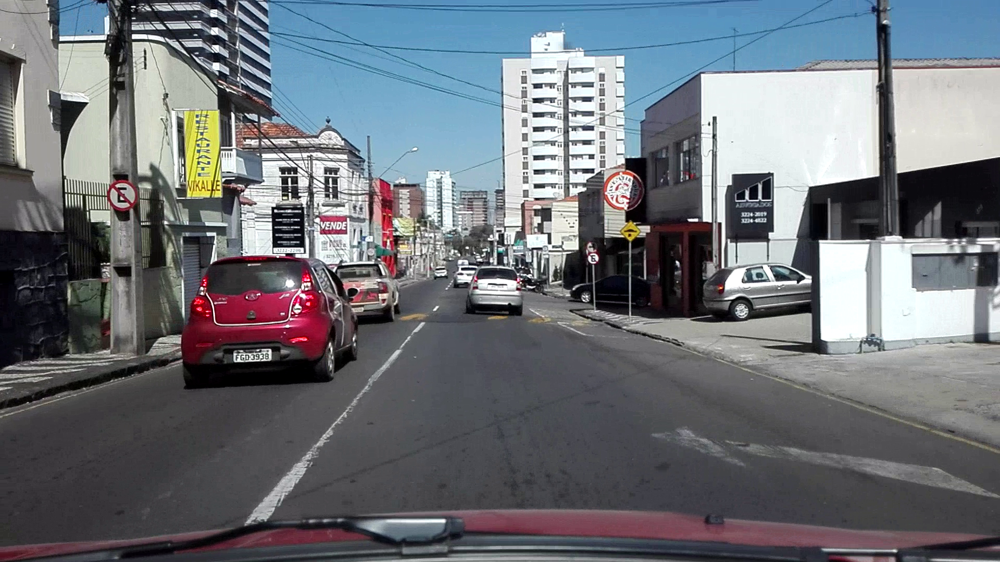

In [ ]:
# Examine image
example_img_path = os.path.join(data_dir, "training", "track0034", "track0034[09].png")
example_img = cv2.imread(example_img_path)
print("Shape: row, column, color channel:", example_img.shape)
display.display(Image(example_img_path))

In [ ]:
# Examine txt
example_txt_path = os.path.join(data_dir, "training", "track0034", "track0034[09].txt")
with open(example_txt_path) as file:
  for line in file.readlines():
    print(line)

camera: Huawei P9 Lite

position_vehicle: 347 490 341 257

	type: car

	make: JAC

	model: J2

	year: 2012

plate: FGD-3938

position_plate: 448 670 74 27

	char 1: 453 682 7 11

	char 2: 461 681 8 12

	char 3: 471 681 7 12

	char 4: 482 681 7 11

	char 5: 491 680 7 11

	char 6: 500 679 7 12

	char 7: 509 679 7 12


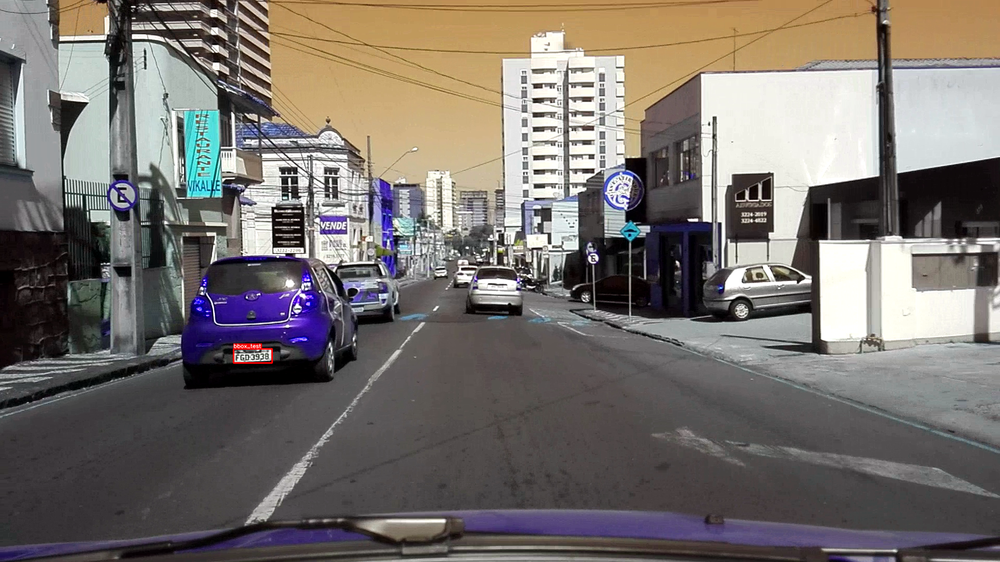

In [ ]:
# Examine Bounding Box
BOX_COLOR = (255, 0, 0) # Red
TEXT_COLOR = (255, 255, 255) # White
def visualize_bbox(img, bbox, class_name, color=BOX_COLOR, thickness=2):
    """Visualizes a single bounding box on the image"""
    x_min, y_min, w, h = bbox
    x_min, x_max, y_min, y_max = int(x_min), int(x_min + w), int(y_min), int(y_min + h)
   
    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    
    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.35, 1)    
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
    cv2.putText(
        img,
        text=class_name,
        org=(x_min, y_min - int(0.3 * text_height)),
        fontFace=cv2.FONT_HERSHEY_SIMPLEX,
        fontScale=0.35, 
        color=TEXT_COLOR, 
        lineType=cv2.LINE_AA,
    )
    return img

img = visualize_bbox(example_img, [448,670,74,27], class_name="bbox_test")
import PIL
display.display(PIL.Image.fromarray(img))

## Step 3 - Transform Data to YOLO format
One-time only

### Attempt filename reformat

In [ ]:
# example 
print("image_path:", example_img_path)
print("txt_path:", example_txt_path)
print(os.path.basename(example_img_path))
example_img_filename = os.path.basename(example_img_path).replace("[","-").replace("]","-")
example_txt_filename = os.path.basename(example_txt_path).replace("[","-").replace("]","-")
print("example_img_filename:", example_img_filename)
print("example_txt_filename:", example_txt_filename)

### Attempt with Roboflow

In [ ]:
# ========================
# Upload image to roboflow
# ========================

from PIL import Image as PILImage
import io
import base64
import requests
import urllib.parse

# Convert to RGB
image = PILImage.open(example_img_path).convert("RGB")

# Convert to JPEG Buffer
buffered = io.BytesIO()
image.save(buffered, format="PNG")

# Base 64 Encode
img_str = base64.b64encode(buffered.getvalue())
img_str = img_str.decode("ascii")

# Construct URL
upload_url = "".join([
    "https://api.roboflow.com/dataset/255-license-plate-recognition-private/upload",
    "?api_key=NMFDcZmtMsEdgCxlIXtf",
    f"&name={os.path.basename(example_img_filename)}.jpg",
    "&split=train"
])

# POST to the API
r = requests.post(upload_url, data=img_str, headers={
    "Content-Type": "application/x-www-form-urlencoded"
})

# Output upload result
print(r.json())

In [ ]:
# ========================
# Upload annotation
# ========================

example_txt_content = open(example_txt_path).read()

# Construct the URL, o1LjO3g2hbTdTIV5BYVg is the ID returned from upload image
upload_url = "".join([
    f"https://api.roboflow.com/dataset/255-license-plate-recognition-private/annotate/o1LjO3g2hbTdTIV5BYVg",
    "?api_key=NMFDcZmtMsEdgCxlIXtf",
    "&name=", example_txt_filename
])

print(upload_url)

# POST to the API
r = requests.post(upload_url, data=example_txt_content, headers={
  "Content-Type": "text/plain"
})

# Output result
print(r.json())

*Unfortunately, Roboflow doesn't support this annotation format*

### Attempt Manually

In [ ]:
# Image dimension
example_img = cv2.imread(example_img_path)  # row, column, channel

with open(example_txt_path) as file:
  for line in file.readlines():
    # Only care about vehicle position for now
    if "position_vehicle" in line:
      # Parse line
      position_array = line.split(": ")[1].replace("\n", "").split(" ")
      position_array = [int(num) for num in position_array]
      
      # Transform (x_min, y_min, width, height) 
      # to (x_center, y_center, width, height)
      position_array[0] = position_array[0] + position_array[2] / 2
      position_array[1] = position_array[1] + position_array[3] / 2

      # Normalize to 1
      position_array[0] = position_array[0] / example_img.shape[1]
      position_array[2] = position_array[2] / example_img.shape[1]
      position_array[1] = position_array[1] / example_img.shape[0]
      position_array[3] = position_array[3] / example_img.shape[0]

# Prepend with label 0 should be fine


### Continue Sample Manually

In [ ]:
def line_to_position_array(line, img_shape=(1080, 1920, 3)):
  # Parse line
  position_array = line.split(": ")[1].replace("\n", "").split(" ")[0:4]
  position_array = [int(num) for num in position_array]
  
  # Transform (x_min, y_min, width, height) to (x_center, y_center, width, height)
  position_array[0] = position_array[0] + position_array[2]/2
  position_array[1] = position_array[1] + position_array[3]/2

  # Normalize to 1
  # position_array[0] = position_array[0] / example_img.shape[1]
  # position_array[2] = position_array[2] / example_img.shape[1]
  # position_array[1] = position_array[1] / example_img.shape[0]
  # position_array[3] = position_array[3] / example_img.shape[0]
  position_array[0] = position_array[0] / img_shape[1]
  position_array[2] = position_array[2] / img_shape[1]
  position_array[1] = position_array[1] / img_shape[0]
  position_array[3] = position_array[3] / img_shape[0]
  return position_array

def original_txt_to_yolov5(path):
  with open(path) as file:
    for line in file.readlines():
      # Only care about vehicle position for now
      if "position_vehicle" in line:
        position_vehicle_array = line_to_position_array(line)
      if "plate" == line.split(": ")[0]:
        plate_array = line.split(": ")[1].replace("\n", "")
      if "position_plate" in line:
        position_plate_array = line_to_position_array(line)

  return [[0] + position_vehicle_array, [1] + position_plate_array, plate_array]

In [ ]:
# Create Folders
try:
  os.mkdir(copy_dir)
  [os.mkdir(os.path.join(copy_dir, name)) for name in ["training", "testing", "validation"]]
except FileExistsError:
  pass

In [ ]:
# Copy Image First
from shutil import copyfile
from pathlib import Path
from tqdm import tqdm
for sub_dir in ["training", "testing", "validation"]:
  print(f"Working on {sub_dir}")
  for filename in tqdm(list(Path(os.path.join(data_dir, sub_dir)).rglob("*.png"))):
    destination_filename = os.path.basename(filename)
    destination_filename = destination_filename.replace("]","").replace("[", "-")
    copyfile(filename, os.path.join(copy_dir, sub_dir, destination_filename))

Working on training


 74%|███████▎  | 1324/1800 [19:13<06:54,  1.15it/s]


OSError: ignored

In [ ]:
# Transform txt
filename_plate_dict = {"training":{}, "testing":{}, "validation":{}}
for sub_dir in ["training", "testing", "validation"]:
  print(f"Working on {sub_dir}")
  for source_filename in tqdm(list(Path(os.path.join(data_dir, sub_dir)).rglob("*.txt"))):
    destination_filename = os.path.basename(source_filename)
    destination_filename = destination_filename.replace("]","").replace("[", "-")

    # position_array = [position_vehicle_array, position_plate_array, plate_array]
    position_array = original_txt_to_yolov5(source_filename) 
    position_vehicle_array = [str(x) for x in position_array[0]]
    position_plate_array = [str(x) for x in position_array[1]]
    destination_file_content0 = " ".join(position_vehicle_array)
    destination_file_content1 = " ".join(position_plate_array)

    
    with open(os.path.join(copy_dir, sub_dir, destination_filename), "w") as destination_file:
      destination_file.write(destination_file_content0 +'\n')
      destination_file.write(destination_file_content1)

    # filename and plate_array to dictionary 
    filename_plate_dict[sub_dir][destination_filename[:-4]] = position_array[2]

filename_plate_dict

Working on training


100%|██████████| 1800/1800 [16:40<00:00,  1.80it/s]


Working on testing


100%|██████████| 1800/1800 [15:59<00:00,  1.88it/s]


Working on validation


100%|██████████| 900/900 [08:52<00:00,  1.69it/s]


{'testing': {'track0110-25': 'BBO-8514',
  'track0110-08': 'BBO-8514',
  'track0110-28': 'BBO-8514',
  'track0110-03': 'BBO-8514',
  'track0110-10': 'BBO-8514',
  'track0110-11': 'BBO-8514',
  'track0110-01': 'BBO-8514',
  'track0110-29': 'BBO-8514',
  'track0110-27': 'BBO-8514',
  'track0110-16': 'BBO-8514',
  'track0110-21': 'BBO-8514',
  'track0110-12': 'BBO-8514',
  'track0110-20': 'BBO-8514',
  'track0110-18': 'BBO-8514',
  'track0110-26': 'BBO-8514',
  'track0110-14': 'BBO-8514',
  'track0110-06': 'BBO-8514',
  'track0110-04': 'BBO-8514',
  'track0110-07': 'BBO-8514',
  'track0110-17': 'BBO-8514',
  'track0110-02': 'BBO-8514',
  'track0110-22': 'BBO-8514',
  'track0110-05': 'BBO-8514',
  'track0110-23': 'BBO-8514',
  'track0110-30': 'BBO-8514',
  'track0110-13': 'BBO-8514',
  'track0110-09': 'BBO-8514',
  'track0110-24': 'BBO-8514',
  'track0110-15': 'BBO-8514',
  'track0110-19': 'BBO-8514',
  'track0101-15': 'AMR-2189',
  'track0101-13': 'AMR-2189',
  'track0101-27': 'AMR-2189',

In [ ]:
valid_labels = pd.DataFrame.from_dict(filename_plate_dict['validation'], orient = 'index', columns = ['Plate Label'])
train_labels = pd.DataFrame.from_dict(filename_plate_dict['training'], orient = 'index', columns = ['Plate Label'])
test_labels = pd.DataFrame.from_dict(filename_plate_dict['testing'], orient = 'index', columns = ['Plate Label'])
#test_labels.to_csv('TestLabels.csv')
#valid_labels.to_csv('ValidLabels.csv')
#train_labels.to_csv('TrainLabels.csv')

## Step 4 - Make a smaller Train/Test set
One-time only



In [ ]:
# Create Folders
try:
  os.mkdir(copy_dir_2)
  [os.mkdir(os.path.join(copy_dir_2, name)) for name in ["training", "testing", "validation"]]
except FileExistsError:
  pass

In [ ]:
for sub_dir in ["training", "testing", "validation"]:
  print(f"Working on {sub_dir}")
  for source_filename in tqdm(sorted(list(Path(os.path.join(copy_dir, sub_dir)).rglob("*[159].*")))):
    destination_filename = os.path.basename(source_filename)
    copyfile(source_filename, os.path.join(copy_dir_2, sub_dir, destination_filename))

Working on training


100%|██████████| 1080/1080 [00:36<00:00, 29.31it/s]


Working on testing


100%|██████████| 1080/1080 [02:56<00:00,  6.13it/s]


Working on validation


100%|██████████| 540/540 [01:56<00:00,  4.63it/s]


# Train My Model

In [ ]:
# Examin YOLO train.py
!python train.py -h

wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 2
wandb: You chose 'Use an existing W&B account'
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
usage: train.py [-h] [--weights WEIGHTS] [--cfg CFG] [--data DATA] [--hyp HYP]
                [--epochs EPOCHS] [--batch-size BATCH_SIZE] [--imgsz IMGSZ]
                [--rect] [--resume [RESUME]] [--nosave] [--noval]
                [--noautoanchor] [--evolve [EVOLVE]] [--bucket BUCKET]
                [--cache [CACHE]] [--image-weights] [--device DEVICE]
                [--multi-scale] [--single-cls] [--adam] [--sync-bn]
                [--workers WORKERS] [--project PROJECT] [--name NAME]
                [--exist-ok] [--quad] [--linear-lr]
                [--label-smoothin

In [ ]:
# Tensorboard  (optional)
%load_ext tensorboard
%tensorboard --logdir runs/train

<IPython.core.display.Javascript object>

In [ ]:
# Weights & Biases  (optional)
%pip install -q wandb
import wandb

     |████████████████████████████████| 1.7 MB 403 kB/s 
     |████████████████████████████████| 180 kB 18.4 MB/s 
     |████████████████████████████████| 140 kB 18.5 MB/s 
     |████████████████████████████████| 97 kB 6.4 MB/s 
     |████████████████████████████████| 63 kB 1.2 MB/s 


In [ ]:
!python train.py --img 1920 \
--rect \
--batch 12 \
--epochs 60 \
--data //content/drive/Shareddrives/Data\ 255/DataSets/UFPR-ALPR\ dataset\ copy1/data.yaml \
--weights yolov5s.pt \
--resume \
--save-period 1 \
--adam

wandb: Currently logged in as: yantang (use `wandb login --relogin` to force relogin)
train: weights=yolov5s.pt, cfg=, data=//content/drive/Shareddrives/Data 255/DataSets/UFPR-ALPR dataset copy1/data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=60, batch_size=12, imgsz=1920, rect=True, resume=True, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, adam=True, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 5 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
Resuming training from ./runs/train/exp11/weights/last.pt
YOLOv5 🚀 2021-11-15 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01,

In [ ]:
!python val.py -h

usage: val.py [-h] [--data DATA] [--weights WEIGHTS [WEIGHTS ...]]
              [--batch-size BATCH_SIZE] [--imgsz IMGSZ]
              [--conf-thres CONF_THRES] [--iou-thres IOU_THRES] [--task TASK]
              [--device DEVICE] [--single-cls] [--augment] [--verbose]
              [--save-txt] [--save-hybrid] [--save-conf] [--save-json]
              [--project PROJECT] [--name NAME] [--exist-ok] [--half] [--dnn]

optional arguments:
  -h, --help            show this help message and exit
  --data DATA           dataset.yaml path
  --weights WEIGHTS [WEIGHTS ...]
                        model.pt path(s)
  --batch-size BATCH_SIZE
                        batch size
  --imgsz IMGSZ, --img IMGSZ, --img-size IMGSZ
                        inference size (pixels)
  --conf-thres CONF_THRES
                        confidence threshold
  --iou-thres IOU_THRES
                        NMS IoU threshold
  --task TASK           train, val, test, speed or study
  --device DEVICE       cuda device

In [ ]:
! python val.py --weights /content/drive/Shareddrives/Data\ 255/yolo-env/yolov5/runs/train/exp11/weights/best.pt\
 --data /content/drive/Shareddrives/Data\ 255/DataSets/UFPR-ALPR\ dataset\ copy1/data.yaml\
 --task test --verbose --save-json\
 --img 1920 --batch-size 4 --conf-thres 0.5
#  --conf 0.25 --source /content/drive/Shareddrives/Data\ 255/DataSets/UFPR-ALPR\ dataset\ copy1/testing\
#  -- save-txt -- save-conf --save-crop

val: data=/content/drive/Shareddrives/Data 255/DataSets/UFPR-ALPR dataset copy1/data.yaml, weights=['/content/drive/Shareddrives/Data 255/yolo-env/yolov5/runs/train/exp11/weights/best.pt'], batch_size=4, imgsz=1920, conf_thres=0.5, iou_thres=0.6, task=test, device=, single_cls=False, augment=False, verbose=True, save_txt=False, save_hybrid=False, save_conf=False, save_json=True, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 2021-11-15 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model Summary: 213 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning '/content/drive/Shareddrives/Data 255/DataSets/UFPR-ALPR dataset copy1/testing.cache' images and labels... 1800 found, 0 missing, 0 empty, 0 corrupted: 100% 1800/1800 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 450/450 [01:48<00:00,  4.16it/s]
                 all       1800       3600      0.991    

In [ ]:

!python detect.py --weights /content/drive/Shareddrives/Data\ 255/yolo-env/yolov5/runs/train/exp11/weights/best.pt\
 --img 1920  --save-txt --save-conf --save-crop --conf 0.25 \
 --source /content/drive/Shareddrives/Data\ 255/DataSets/UFPR-ALPR\ dataset\ copy1/testing

detect: weights=['/content/drive/Shareddrives/Data 255/yolo-env/yolov5/runs/train/exp11/weights/best.pt'], source=/content/drive/Shareddrives/Data 255/DataSets/UFPR-ALPR dataset copy1/testing, imgsz=[1920, 1920], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=True, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 2021-11-15 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model Summary: 213 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/1800 /content/drive/Shareddrives/Data 255/DataSets/UFPR-ALPR dataset copy1/testing/track0091-01.png: 1088x1920 1 vehicle, 1 plate, Done. (0.023s)
image 2/1800 /content/drive/Shareddrives/Data 255/DataSets/UFPR-ALPR dataset copy1/testing/track0091-02.png: 1088x1920 1 vehicl

#Result

In [ ]:
import json
import pandas as pd
with open('/content/drive/Shareddrives/Data 255/yolo-env/yolov5/runs/val/exp2/best_predictions.json', 'r') as f:
    data = json.load(f)
df = pd.DataFrame(data)


,image_id,category_id,bbox,score
0,track0091-01,0,"[760.856, 328.84, 253.629, 234.545]",0.97401
1,track0091-01,1,"[855.338, 502.977, 63.419, 23.019]",0.92827
2,track0131-07,1,"[1066.581, 518.436, 178.015, 60.428]",0.96009
3,track0131-06,1,"[1065.573, 517.4, 177.18, 59.967]",0.96119
4,track0131-05,1,"[1066.721, 515.691, 177.479, 60.049]",0.95820
...,...,...,...,...
3313,track0114-02,0,"[653.884, 439.923, 406.375, 339.714]",0.96901
3314,track0113-30,1,"[799.601, 629.922, 106.718, 36.305]",0.98714
3315,track0113-30,0,"[642.176, 396.903, 420.913, 351.256]",0.96671
3316,track0114-30,0,"[637.218, 434.988, 469.301, 391.241]",0.96268


In [ ]:
df.groupby(df.category_id,axis = 0).count()

,image_id,bbox,score
category_id,,,
0,1499,1499,1499
1,1819,1819,1819


Shape: row, column, color channel: (1088, 1920, 3)


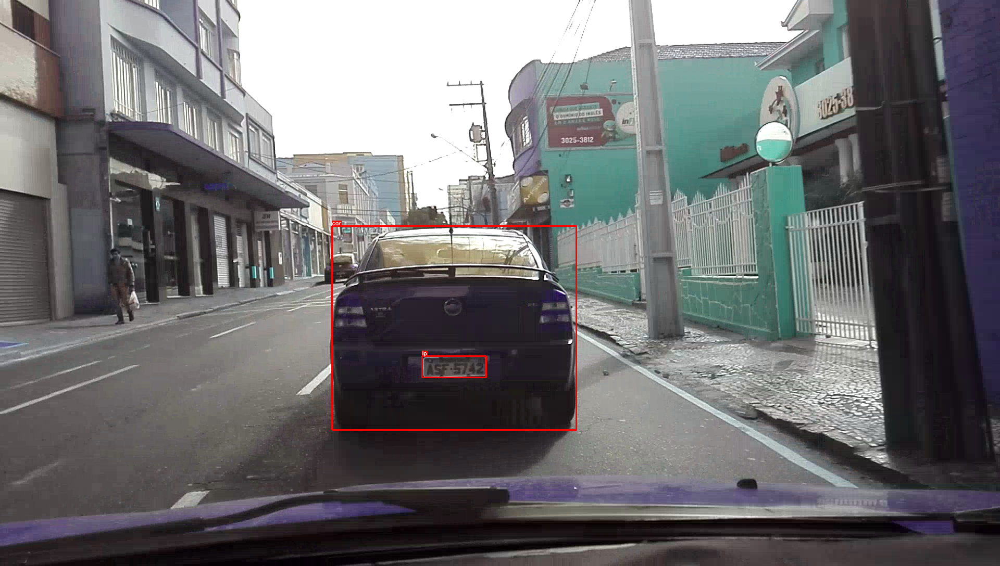

In [ ]:
# Examine image
example_img_path = os.path.join(copy_dir, "testing", "track0114-30.png")
example_img = cv2.imread(example_img_path)
print("Shape: row, column, color channel:", example_img.shape)

img = visualize_bbox(example_img, [810.13, 684.273, 123.868, 41.586], class_name="lp")
img = visualize_bbox(example_img, [637.218, 434.988, 469.301, 391.241]	, class_name="car")
display.display(PIL.Image.fromarray(img))



```
# 此内容为代码格式
```

#Try OCR 

## Install Tesseract

In [ ]:
# !rm -r tesseract-4.1.3
# !curl -O "http://archive.ubuntu.com/ubuntu/pool/universe/t/tesseract/tesseract-ocr_4.1.1-2build2_amd64.deb"
# !dpkg -i tesseract-ocr_4.1.1-2build2_amd64.deb
# !apt remove tesseract-ocr

In [ ]:
%pip install pytesseract

In [ ]:
! apt install tesseract-ocr
! apt install libtesseract-dev
! apt install tesseract-ocr-eng

In [ ]:
!tesseract --version
!tesseract --help-extra

/bin/bash: tesseract: command not found
/bin/bash: tesseract: command not found


## Experiment with Tesseract

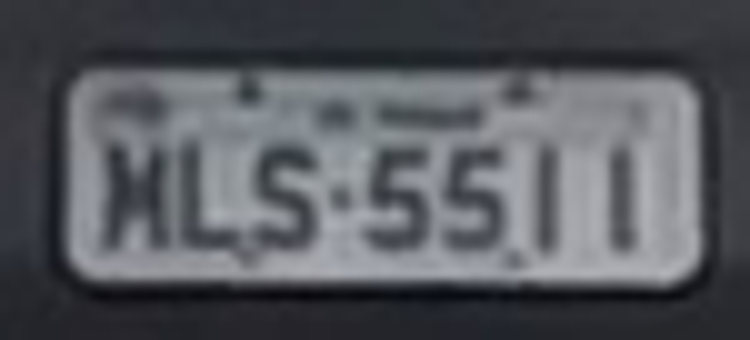

WLS-551 |
 length: 11


In [ ]:
import pytesseract
import PIL
import numpy as np
pytesseract.pytesseract.tesseract_cmd = r'/usr/bin/tesseract'

license_plate_path = '/content/drive/Shareddrives/Data 255/yolo-env/yolov5/runs/detect/exp2/crops/plate/track0091-01.jpg'

def tesseract_orc(img):
  if type(img) == np.ndarray:
    img = Image.fromarray(img)
  img = img.resize((img.size[0]*10, img.size[1]*10))
  display(img)
  result = pytesseract.image_to_string(img, config=r'-l eng --oem 3 --psm 7 ')  
  print(result, "length:",len(result))

# result = pytesseract.image_to_string(PIL.Image.open(license_plate_path), config=r'-l eng --oem 1 --psm 7 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789')
# print(result, "length:",len(result))
tesseract_orc(PIL.Image.open(license_plate_path))

## Improve Tesseract Performance

In [ ]:
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np

import torch
import torchvision.transforms as T

original_img = PIL.Image.open(license_plate_path)

### Binarize

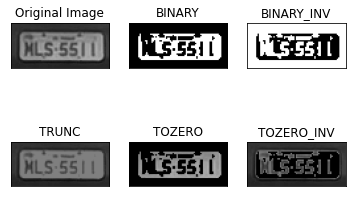

In [ ]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
img = cv.imread(license_plate_path,0)
ret,thresh1 = cv.threshold(img,127,255,cv.THRESH_BINARY)
ret,thresh2 = cv.threshold(img,127,255,cv.THRESH_BINARY_INV)
ret,thresh3 = cv.threshold(img,127,255,cv.THRESH_TRUNC)
ret,thresh4 = cv.threshold(img,127,255,cv.THRESH_TOZERO)
ret,thresh5 = cv.threshold(img,127,255,cv.THRESH_TOZERO_INV)
titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]
for i in range(6):
    plt.subplot(2,3,i+1),plt.imshow(images[i],'gray',vmin=0,vmax=255)
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

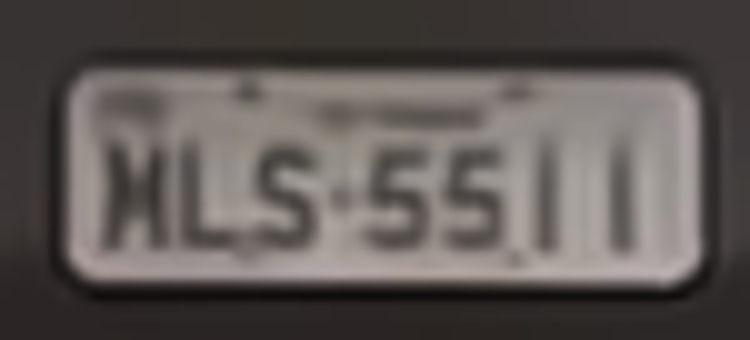

WLS-55 | |
 length: 12


In [ ]:
tesseract_orc(dst)

### Adaptive Binarize

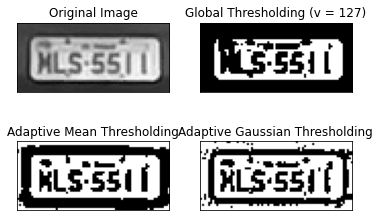

In [ ]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
img = cv.imread(license_plate_path,0)
# img = cv.medianBlur(img,5)
ret,th1 = cv.threshold(img,127,255,cv.THRESH_BINARY)
th2 = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_MEAN_C,\
            cv.THRESH_BINARY,11,2)
th3 = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv.THRESH_BINARY,11,2)
titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]
for i in range(4):
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

### Reduce Noise

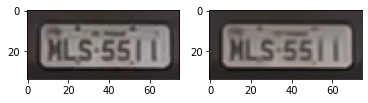

In [ ]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
img = cv.imread(license_plate_path)
dst = cv.fastNlMeansDenoisingColored(img,None,10, #,7,21)
plt.subplot(121),plt.imshow(img)
plt.subplot(122),plt.imshow(dst)
plt.show()

## Other Attempt

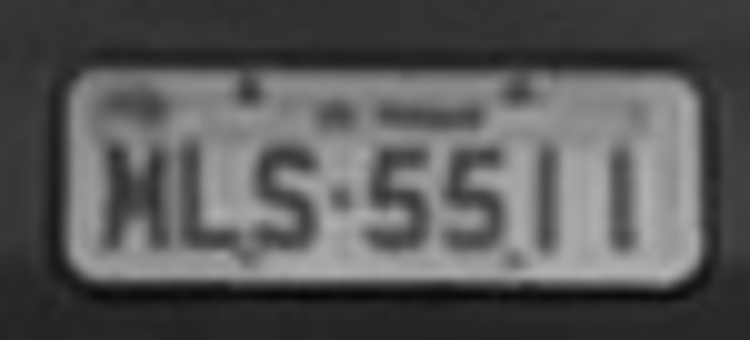

{'jfif': 257, 'jfif_density': (1, 1), 'jfif_unit': 0, 'jfif_version': (1, 1)}

In [ ]:
gray_img = T.Grayscale()(original_img)
display(gray_img.resize((gray_img.size[0]*10, gray_img.size[1]*10)))
original_img.info

In [ ]:
result = pytesseract.image_to_string(gray_img, config=r'-l eng --oem 1 --psm 6')
print(result, "length:",len(result))

WLS'551 1
 length: 11


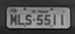

In [ ]:
blurrer = T.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 0.4))
blurred_imgs = blurrer(gray_img)
blurred_imgs

In [ ]:
result = pytesseract.image_to_string(blurred_imgs, config=r'-l eng --oem 1 --psm 6')
print(result, "length:",len(result))

WLS'551 1
 length: 11


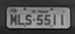

In [ ]:
sharpness_adjuster = T.RandomAdjustSharpness(sharpness_factor=100)
sharpened_imgs = sharpness_adjuster(blurred_imgs)
sharpened_imgs

In [ ]:
result = pytesseract.image_to_string(sharpened_imgs, config=r'-l eng --oem 1 --psm 6')
print(result, "length:",len(result))

WLS'551 1
 length: 11


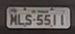

In [ ]:
img = cv2.imread(license_plate_path)
display.display(PIL.Image.fromarray(img))

## Try Another Github Repo

In [ ]:
!git clone https://github.com/ksingh7/ml_experiments.git

Cloning into 'ml_experiments'...
remote: Enumerating objects: 44, done.
remote: Counting objects: 100% (44/44), done.
remote: Compressing objects: 100% (30/30), done.
remote: Total 44 (delta 15), reused 42 (delta 13), pack-reused 0
Unpacking objects: 100% (44/44), done.


In [ ]:
%cd ../ml_experiments/convert_keras_model_to_tensorflow/

/content/drive/Shareddrives/Data 255/yolo-env/ml_experiments/convert_keras_model_to_tensorflow


In [ ]:
import tensorflow as tf
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from local_utils import detect_lp
from os.path import splitext,basename
from tensorflow.keras.models  import model_from_json
from keras.preprocessing.image import load_img, img_to_array
from keras.applications.mobilenet_v2 import preprocess_input
from sklearn.preprocessing import LabelEncoder
from tensorflow import keras
import glob

## Method to load Keras model weight and structure files
def load_model(path):
    try:
        path = splitext(path)[0]
        with open('%s.json' % path, 'r') as json_file:
            model_json = json_file.read()
        model = model_from_json(model_json, custom_objects={})
        model.load_weights('%s.h5' % path)
        print("Model Loaded successfully...")
        return model
    except Exception as e:
        print(e)
wpod_net_path = "models/wpod-net.json"
wpod_net = load_model(wpod_net_path)

def preprocess_image(image_path,resize=False):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img / 255
    if resize:
        img = cv2.resize(img, (224,224))
    return img

def get_plate(image_path, Dmax=608, Dmin = 608):
    vehicle = preprocess_image(image_path)
    ratio = float(max(vehicle.shape[:2])) / min(vehicle.shape[:2])
    side = int(ratio * Dmin)
    bound_dim = min(side, Dmax)
    _ , LpImg, _, cor = detect_lp(wpod_net, vehicle, bound_dim, lp_threshold=0.5)
    return vehicle, LpImg, cor

Model Loaded successfully...


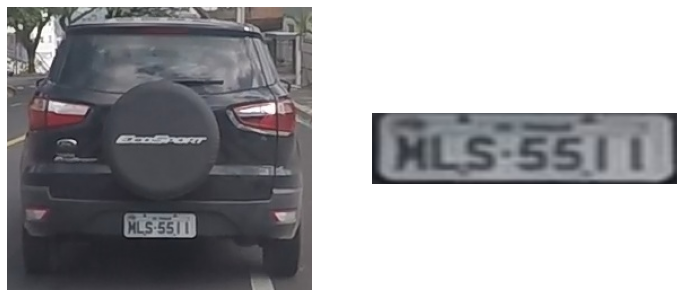

In [ ]:
test_image_path = '/content/drive/Shareddrives/Data 255/yolo-env/yolov5/runs/detect/exp2/crops/vehicle/track0091-01.jpg'
vehicle, LpImg, cor = get_plate(test_image_path)

fig = plt.figure(figsize=(12,6))
grid = gridspec.GridSpec(ncols=2,nrows=1,figure=fig)
fig.add_subplot(grid[0])
plt.axis(False)
plt.imshow(vehicle)
grid = gridspec.GridSpec(ncols=2,nrows=1,figure=fig)
fig.add_subplot(grid[1])
plt.axis(False)
plt.imshow(LpImg[0])

In [ ]:
valid_labels = pd.DataFrame.from_dict(filename_plate_dict['validation'], orient = 'index', columns = ['Plate Label'])
train_labels = pd.DataFrame.from_dict(filename_plate_dict['training'], orient = 'index', columns = ['Plate Label'])
test_labels = pd.DataFrame.from_dict(filename_plate_dict['testing'], orient = 'index', columns = ['Plate Label'])
#test_labels.to_csv('TestLabels.csv')
#valid_labels.to_csv('ValidLabels.csv')
#train_labels.to_csv('TrainLabels.csv')